## Load packages

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from brainspace.utils.parcellation import map_to_labels
import hcp_utils as hcp
from matplotlib.colors import ListedColormap
import scipy.stats as ss
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM
from neuroCombat import neuroCombat
import cmasher as cmr
import func_utils as fu
fdr = fu.fdr
se = fu.se
sub_corr = fu.sub_corr
plot_corr_bar = fu.plot_corr_bar
compare = fu.compare

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
cmap_brain = ListedColormap(np.vstack(([211/256, 211/256, 211/256, 1], fu.rgb)))
cmap = ListedColormap(fu.rgb)
ca = np.array(pd.read_csv('../data/ca_glasser_network.csv',header=None))[:,0].astype(float)
color = ca[:180]
datasite =['NYU','Pitt','USM', 'NYU_II','TCD']

In [3]:
mmp_ll = fu.mmp_ll
phen = fu.phen
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,ASD,TCD,15.50,98,2,5,0,0.165400
1,29099,ASD,TCD,10.75,123,3,5,0,0.148400
2,29101,ASD,TCD,14.00,103,3,4,0,0.248200
3,29103,ASD,TCD,14.75,108,4,3,0,0.161700
4,29104,ASD,TCD,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,ASD,USM,18.25,106,4,9,1,0.175961
279,32643,ASD,USM,16.92,84,1,11,0,0.122636
280,32646,ASD,USM,20.17,108,3,5,0,0.062141
281,32647,ASD,USM,32.55,126,4,6,0,0.121629


## data harmony

In [4]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site',
                              continuous_cols=['age','FIQ','meanFD'])['data']
    return data_combat.T

In [5]:
cov = phen[['site', 'age','FIQ','meanFD']]
cov

,site,age,FIQ,meanFD
0,TCD,15.50,98,0.165400
1,TCD,10.75,123,0.148400
2,TCD,14.00,103,0.248200
3,TCD,14.75,108,0.161700
4,TCD,19.25,119,0.066200
...,...,...,...,...
278,USM,18.25,106,0.175961
279,USM,16.92,84,0.122636
280,USM,20.17,108,0.062141
281,USM,32.55,126,0.121629


# Intra asymmetry

In [6]:
path = '../results/GSR/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [7]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_asd_intra_fiq_fd.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

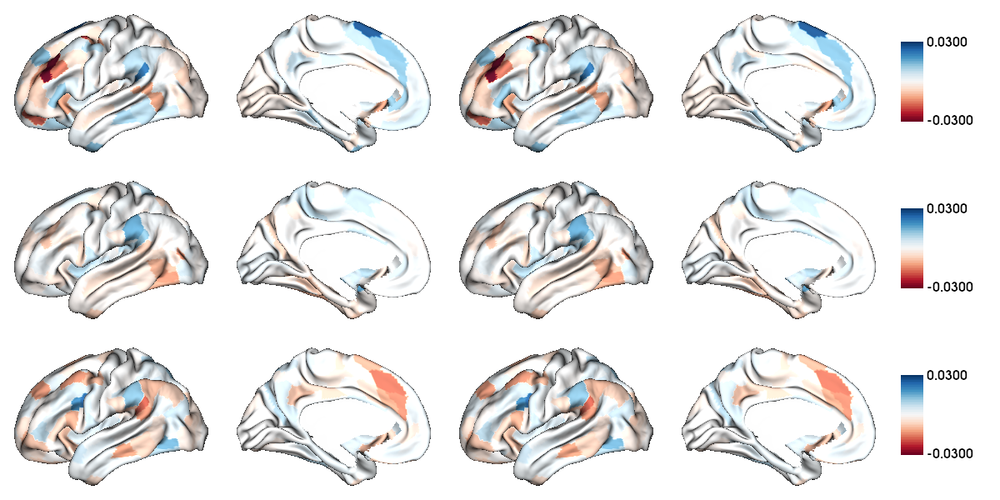

In [8]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/asd_intra_AI_fiq_fd.png')

In [9]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/asd_stat_intra_cohen_pfdr_fiq_fd.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

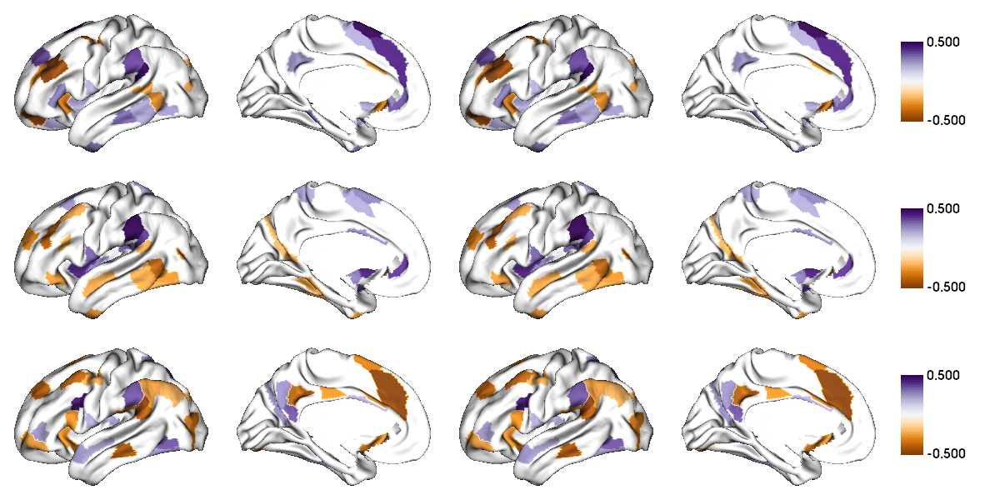

In [10]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/asd_intra_cohen_fd.png')

## Control

In [11]:
con_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[con_pos]
np.savetxt('../results/mean_sd_con_intra_fiq_fd.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

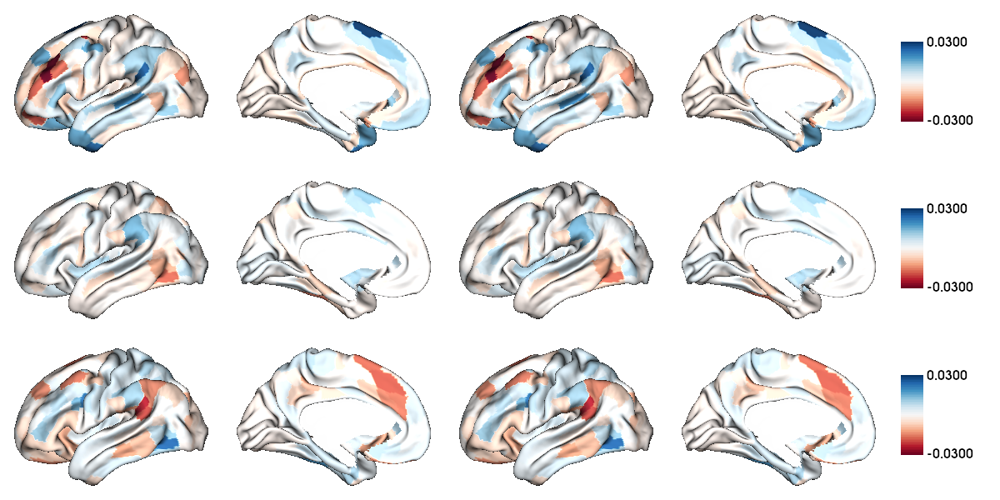

In [12]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/con_intra_AI_fiq_fd.png')

In [13]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/con_stat_intra_cohen_pfdr_fiq_fd.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

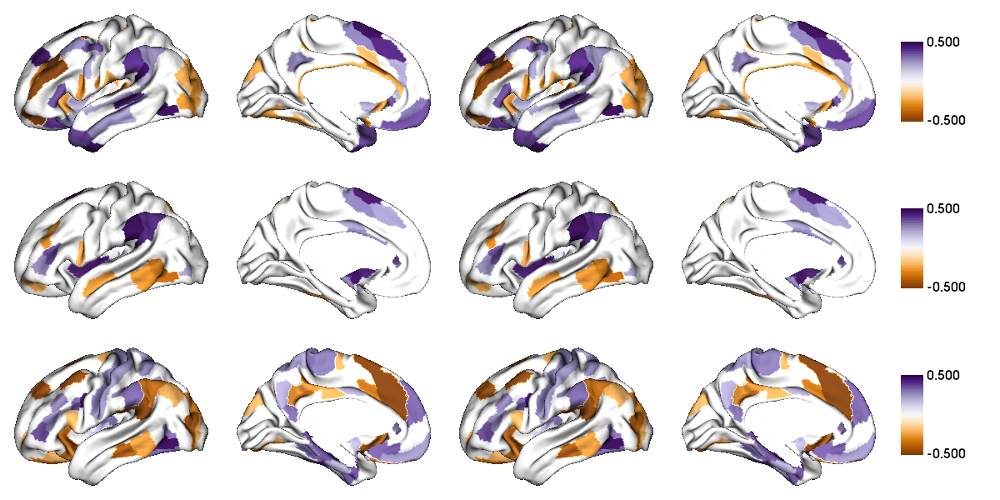

In [14]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/con_intra_cohen_fiq_fd.png')

# Inter asymmetry

In [15]:
path = '../results/GSR/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [16]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_asd_inter_fiq_fd.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

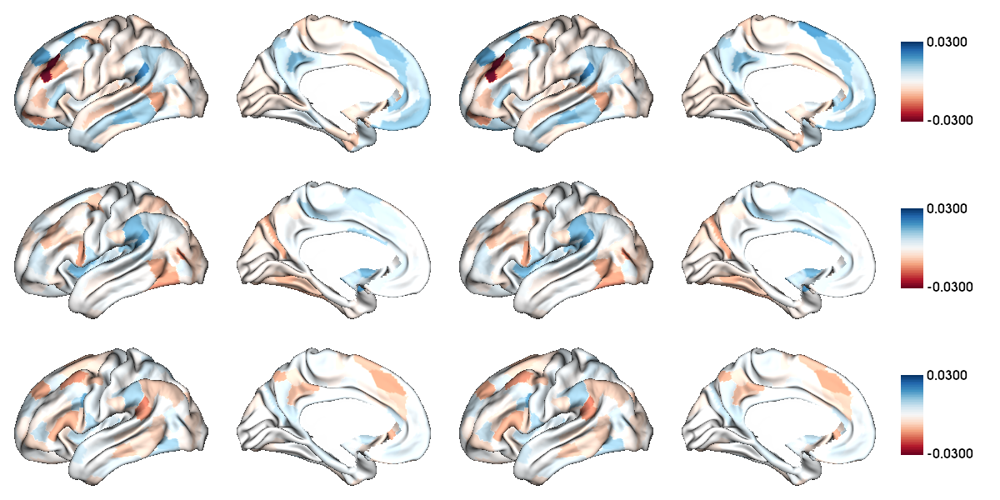

In [17]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/asd_inter_AI_fiq_fd.png')

In [18]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/asd_stat_inter_cohen_pfdr_fiq_fd.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

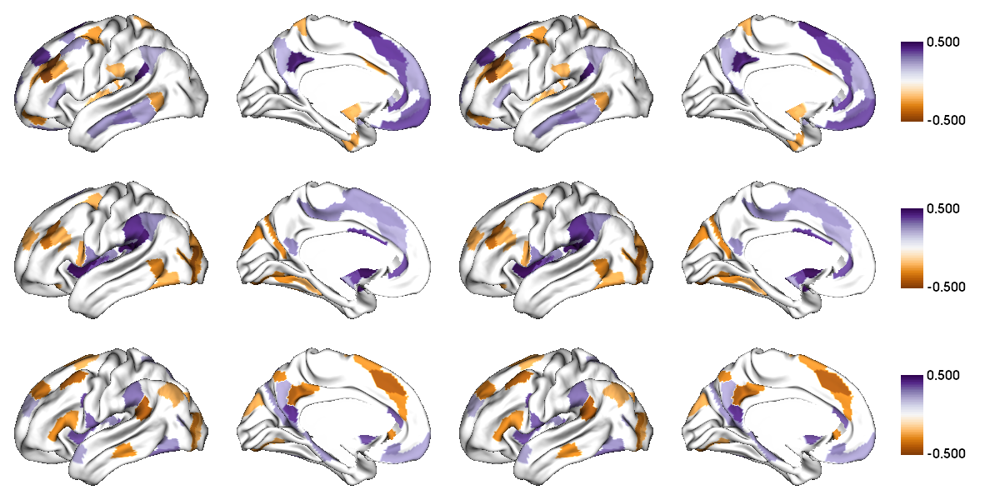

In [19]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/asd_inter_cohen_fiq_fd.png')

## Control

In [20]:
asd_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_con_inter_fiq_fd.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)),axis=1))

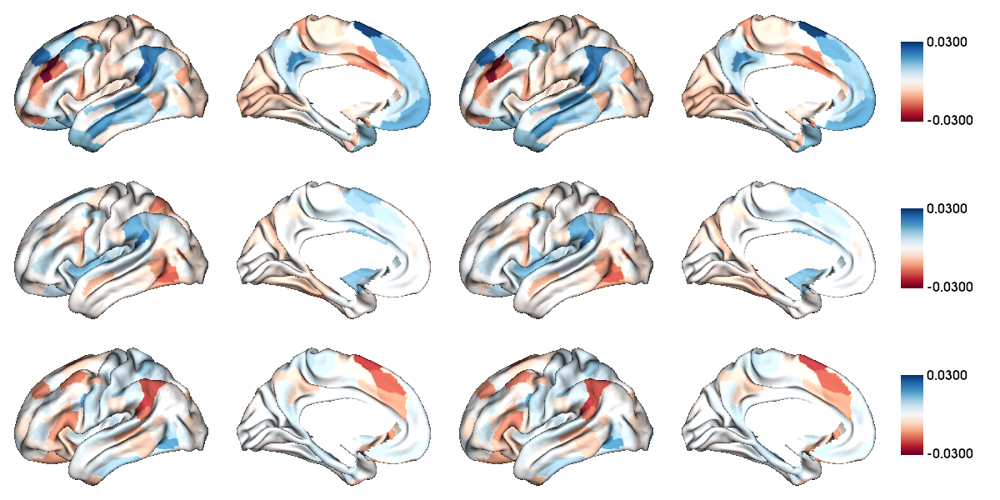

In [21]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/con_inter_AI_fiq_fd.png')

In [22]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/con_stat_inter_cohen_pfdr_fiq_fd.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

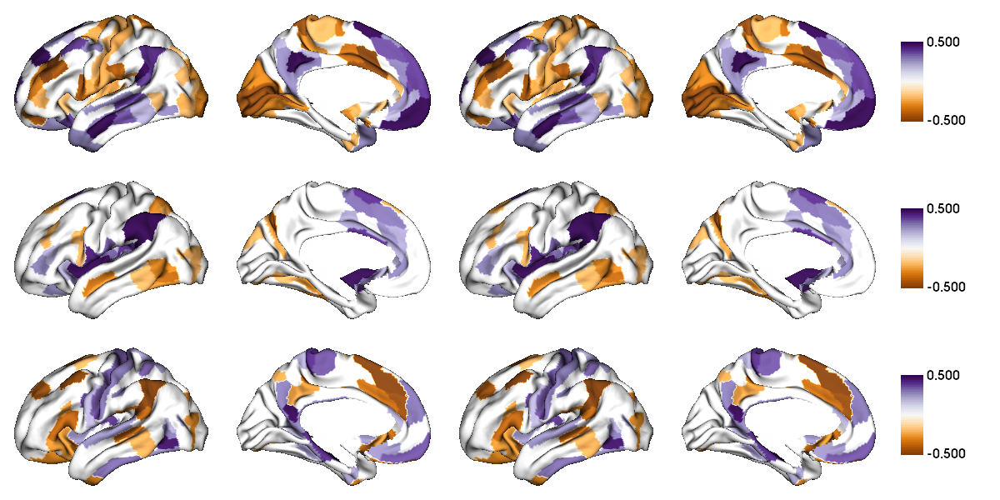

In [23]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/con_inter_cohen_fiq_fd.png')

# Effects of DX group

## load phenotype data

In [24]:
group = np.array(phen['group'])
group[group=='ASD'] = 1.
group[group=='CONTROL'] = 2.
site = np.array(phen['site'])
site[site=='NYU'] = 1.
site[site=='Pitt'] = 2.
site[site=='USM'] = 3.
site[site=='NYU_II'] = 4.
site[site=='TCD'] = 5.
#age = np.array(phen['age'])
#age[age>17.99999] = 1
#age[age>11.99999] = 2
#age[age>5.99999] = 3
phen['group'] = group
phen['site'] = site
#phen['age'] =age
phen['group'] = pd.to_numeric(phen['group'])
phen['site'] = pd.to_numeric(phen['site'])
#phen['age'] = pd.to_numeric(phen['age'])
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,15.50,98,2,5,0,0.165400
1,29099,1.0,5.0,10.75,123,3,5,0,0.148400
2,29101,1.0,5.0,14.00,103,3,4,0,0.248200
3,29103,1.0,5.0,14.75,108,4,3,0,0.161700
4,29104,1.0,5.0,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,18.25,106,4,9,1,0.175961
279,32643,1.0,3.0,16.92,84,1,11,0,0.122636
280,32646,1.0,3.0,20.17,108,3,5,0,0.062141
281,32647,1.0,3.0,32.55,126,4,6,0,0.121629


In [25]:
cov = phen[['site', 'age','FIQ','meanFD']]
cov

,site,age,FIQ,meanFD
0,5.0,15.50,98,0.165400
1,5.0,10.75,123,0.148400
2,5.0,14.00,103,0.248200
3,5.0,14.75,108,0.161700
4,5.0,19.25,119,0.066200
...,...,...,...,...
278,3.0,18.25,106,0.175961
279,3.0,16.92,84,0.122636
280,3.0,20.17,108,0.062141
281,3.0,32.55,126,0.121629


In [26]:
group = FixedEffect(phen['group'], 'group')
fiq = FixedEffect(phen['FIQ'], 'fiq')
fd = FixedEffect(phen['meanFD'], 'fd')

In [27]:
model = group
model

,intercept,group
0,1,1.0
1,1,1.0
2,1,1.0
3,1,1.0
4,1,1.0
...,...,...
278,1,1.0
279,1,1.0
280,1,1.0
281,1,1.0


## Intra

In [28]:
path = '../results/grad/intra/'
sub = phen['ID']
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [29]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1.shape

(283, 180)

In [30]:
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [31]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [32]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [33]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-4.289681131274902,
 3.793938337237691,
 -2.710805251170609,
 2.7561755469583056,
 -2.8311052635451093,
 2.3948870087860157,
 0.2357743966580667,
 4.503450666909751)

In [34]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(2.4636385749678693e-05,
 0.006230703368893823,
 0.004973752258397185,
 4.905217928342035e-06)

In [35]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.004434549434942165,
 0.4080176049113553,
 0.8363788340487834,
 0.0008829392271015663)

In [36]:
a = fdr(p_g123)
thres=0.05/3
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]= 1
p_g2[np.logical_or(p_g2>thres,a==1)] = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_intra_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [37]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

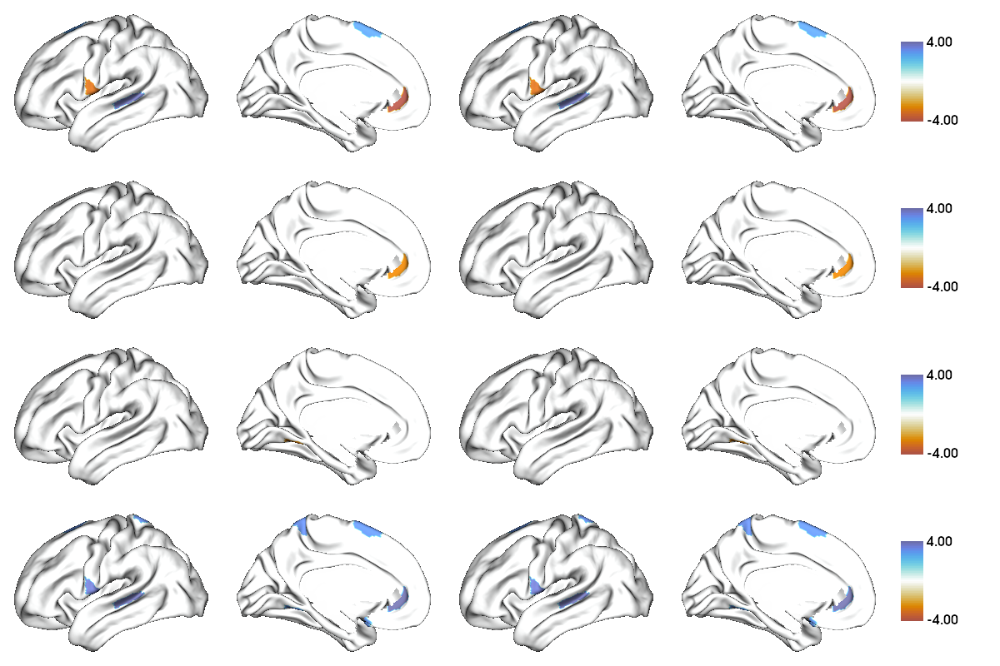

In [38]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/control_asd_t_intra_fiq_fd.png')

### network-wise

In [39]:
path = '../results/grad/network/intra/'

n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [40]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [41]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [42]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)  

In [43]:
t_g1, t_g2, t_g3, t_g123

(array([-0.4952313 ,  0.0551481 , -0.36658729, -0.77833656, -0.55737824,
         3.67917449, -0.71477768, -0.99269577,  0.11438114,  1.4237539 ,
        -1.57894427, -0.62074307]),
 array([ 0.70817948,  0.51827924, -0.00772191, -0.55955955, -0.79423718,
         1.81013218, -1.20320643,  0.17355035, -0.03921975, -0.11254302,
         0.51011577, -0.16310415]),
 array([-1.21919428, -0.32952341,  2.33830733, -0.96294735,  0.94424474,
        -0.68780918,  0.55124101, -0.23254467, -0.58616061, -1.67193932,
         2.03897904, -0.80461898]),
 array([1.27377958, 0.73215155, 2.50372469, 1.19652849, 1.53036185,
        3.73442273, 1.46514252, 1.41260868, 0.58793521, 1.91566245,
        2.34353521, 1.07975867]))

In [44]:
p_g1, p_g2, p_g3, p_g123

(array([6.20823891e-01, 9.56059662e-01, 7.14202769e-01, 4.37025512e-01,
        5.77712742e-01, 2.80399884e-04, 4.75339822e-01, 3.21712275e-01,
        9.09017347e-01, 1.55627149e-01, 1.15473842e-01, 5.35271830e-01]),
 array([0.47942082, 0.6046713 , 0.99384434, 0.57622564, 0.4277276 ,
        0.07134346, 0.22990917, 0.86234381, 0.96874303, 0.91047322,
        0.6103708 , 0.87055367]),
 array([0.22379289, 0.74200559, 0.02007277, 0.33640186, 0.34585576,
        0.4921403 , 0.58190651, 0.81628427, 0.55823812, 0.09564939,
        0.04238778, 0.42171981]),
 array([1.01897056e-01, 2.32343137e-01, 6.42829459e-03, 1.16249474e-01,
        6.35260675e-02, 1.13891465e-04, 7.20000019e-02, 7.94386984e-02,
        2.78523989e-01, 2.82114035e-02, 9.89955855e-03, 1.40587778e-01]))

In [45]:
fdr(p_g1), fdr(p_g2),fdr(p_g3), fdr(p_g123)

(array([0.82776519, 0.95605966, 0.85704332, 1.        , 0.86656911,
        0.0033648 , 0.95067964, 0.96513682, 0.99165529, 0.6225086 ,
        0.69284305, 0.91760885]),
 array([1.        , 1.        , 0.99384434, 1.        , 1.        ,
        0.85612158, 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        ]),
 array([0.67137866, 0.80946065, 0.2408732 , 0.80736447, 0.69171152,
        0.73821045, 0.69828781, 0.81628427, 0.7443175 , 0.38259755,
        0.25432667, 0.72294825]),
 array([0.15284558, 0.25346524, 0.03856977, 0.1549993 , 0.15246256,
        0.0013667 , 0.144     , 0.13618063, 0.27852399, 0.08463421,
        0.03959823, 0.16870533]))

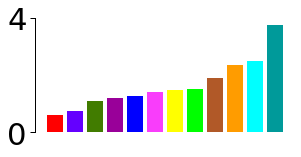

In [46]:
fu.plot_t_single(t_g123, '../figures/ca_asd_con_intra_multiT_fiq_fd.png')

In [47]:
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/ca_asdVScon_t_p_g1g2g3_pdfr123_intra_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

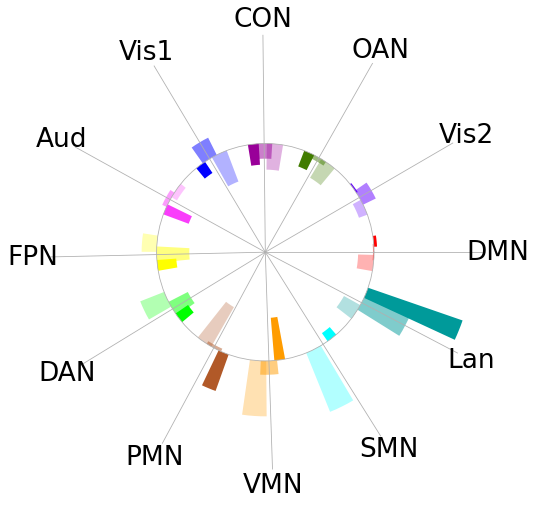

In [48]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_intra_t_g123_fiq_fd.png')

## Inter

In [49]:
path = '../results/grad/inter/'
n = len(sub)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [50]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = np.array(matrix).T[2].T
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [51]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [52]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(), t_g3.min(),t_g3.max(), t_g123.min(), t_g123.max()

(-4.392445274558257,
 3.8359844860051564,
 -2.5648453373606195,
 1.982841222283535,
 -2.89919353397531,
 3.1466541647221082,
 0.48957551987226144,
 4.9834116291322585)

In [53]:
[p_g1.min(), fdr(p_g1).min(), p_g2.min(), fdr(p_g2).min(),
p_g3.min(), fdr(p_g3).min(), p_g123.min(), fdr(p_g123).min()]

[1.589473638340855e-05,
 0.002861052549013539,
 0.010841759782699472,
 0.9178241835974921,
 0.001828964260720861,
 0.24218269489498123,
 5.468765469710188e-07,
 9.843777845478339e-05]

In [54]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]  = 1
p_g2[np.logical_or(p_g2>thres,a==1)]  = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_inter_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [55]:
a = fdr(p_g123)
a[a>0.05]=1
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

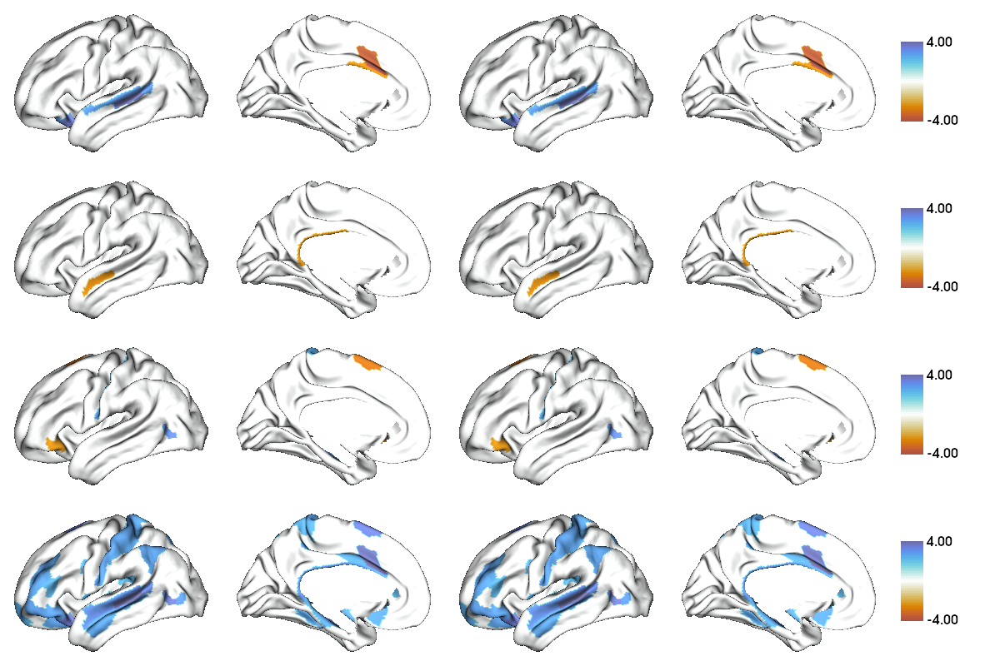

In [56]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/control_asd_t_inter_fiq_fd.png')

#### network-wise

In [57]:
path = '../results/grad/network/inter/'
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [58]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T

In [59]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [60]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof) 

In [61]:
t_g1, t_g2, t_g3, t_g123

(array([-1.06305922, -1.091887  , -0.7907954 , -2.7053357 , -1.15032782,
         3.97298878, -0.32769691, -0.11346586,  1.57471807,  1.06127427,
        -0.99798366, -0.55494694]),
 array([ 0.60882526, -0.11406859,  0.59358602,  1.20818981, -1.16705816,
         0.68207414, -0.59233466,  0.46383203, -1.18130575,  0.0101075 ,
        -0.21825873,  1.32342289]),
 array([-0.33850491,  0.79361203,  3.34712545, -1.2417878 ,  0.96462497,
        -2.24849625, -0.40294569, -0.19165424, -0.08680947, -1.00031402,
         0.72259599, -0.10622554]),
 array([1.09872437, 1.64585529, 3.44271128, 3.09405463, 2.13950989,
        4.48345128, 0.73083562, 0.59080489, 2.18804152, 1.26627346,
        1.17415487, 1.78983231]))

In [62]:
p_g1, p_g2, p_g3, p_g123

(array([2.88667806e-01, 2.75818053e-01, 4.29730305e-01, 7.24042285e-03,
        2.50986872e-01, 9.02686696e-05, 7.43384852e-01, 9.09742254e-01,
        1.16446705e-01, 2.89476555e-01, 3.19145886e-01, 5.79372419e-01]),
 array([0.54313213, 0.90926488, 0.55326653, 0.22799005, 0.24417629,
        0.49575389, 0.55410283, 0.64312719, 0.23848011, 0.99194269,
        0.82738595, 0.18677053]),
 array([7.35235519e-01, 4.28090956e-01, 9.27881351e-04, 2.15350340e-01,
        3.35562100e-01, 2.53195438e-02, 6.87294572e-01, 8.48151464e-01,
        9.30884782e-01, 3.18019174e-01, 4.70529086e-01, 9.15479198e-01]),
 array([1.36414402e-01, 5.04557760e-02, 3.31795717e-04, 1.08668831e-03,
        1.66279422e-02, 5.35449296e-06, 2.32744246e-01, 2.77563021e-01,
        1.47450578e-02, 1.03231951e-01, 1.20663566e-01, 3.72787692e-02]))

In [63]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.57733561, 0.66196333, 0.57297374, 0.04344254, 0.75296062,
        0.00108322, 0.81096529, 0.90974225, 0.46578682, 0.49624552,
        0.47871883, 0.6952469 ]),
 array([1.        , 0.99192532, 0.94845691, 1.        , 0.73252887,
        1.        , 0.83115425, 0.85750292, 0.95392042, 0.99194269,
        0.99286314, 1.        ]),
 array([0.98031403, 0.85618191, 0.01113458, 0.86140136, 0.80534904,
        0.15191726, 1.        , 1.        , 0.93088478, 0.95405752,
        0.80662129, 0.99870458]),
 array([1.63697283e-01, 8.64956161e-02, 1.99077430e-03, 4.34675325e-03,
        3.99070613e-02, 6.42539155e-05, 2.53902813e-01, 2.77563021e-01,
        4.42351733e-02, 1.54847927e-01, 1.60884754e-01, 7.45575383e-02]))

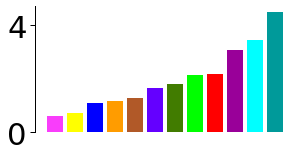

In [64]:
fu.plot_t_single(t_g123, '../figures/ca_asd_con_inter_multiT_fiq_fd.png')

In [65]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
np.savetxt('../results/ca_asdVScon_t_p_g1g2g3_pdfr123_inter_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

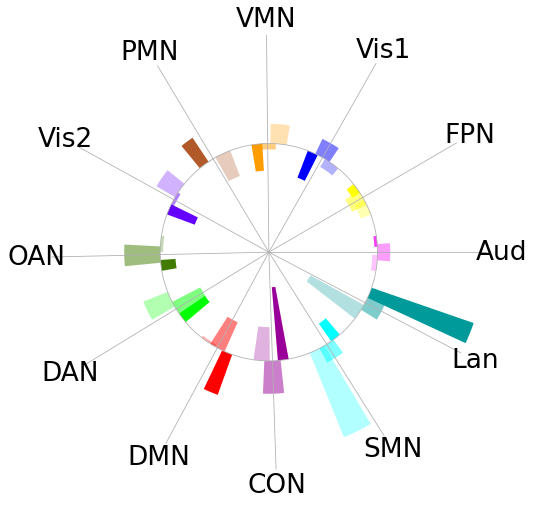

In [66]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_inter_t_g123_fiq_fd.png')

# AGE effects

## phen

In [67]:
phen['age'][phen['age']>18] = 3
phen['age'][phen['age']>12] = 2
phen['age'][phen['age']>4] = 1
phen['group'][phen['group']==2]=-1
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,2.0,98,2,5,0,0.165400
1,29099,1.0,5.0,1.0,123,3,5,0,0.148400
2,29101,1.0,5.0,2.0,103,3,4,0,0.248200
3,29103,1.0,5.0,2.0,108,4,3,0,0.161700
4,29104,1.0,5.0,3.0,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,3.0,106,4,9,1,0.175961
279,32643,1.0,3.0,2.0,84,1,11,0,0.122636
280,32646,1.0,3.0,3.0,108,3,5,0,0.062141
281,32647,1.0,3.0,3.0,126,4,6,0,0.121629


In [68]:
# control_adult,adol,kid and asd_adult,adol,kid
age_dx = [np.array(phen[phen['group']==-1][phen['age']==3].index),
          np.array(phen[phen['group']==-1][phen['age']==2].index),
          np.array(phen[phen['group']==-1][phen['age']==1].index),
          np.array(phen[phen['group']==1][phen['age']==3].index),
          np.array(phen[phen['group']==1][phen['age']==2].index),
          np.array(phen[phen['group']==1][phen['age']==1].index)]
[len(age_dx[i]) for i in range(6)]

[65, 46, 32, 60, 43, 37]

In [149]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site',
                              )['data'] #continuous_cols=['FIQ','meanFD']
    return data_combat.T

In [143]:
cov = pd.DataFrame(phen[['site','FIQ','meanFD']])
cov

,site,FIQ,meanFD
0,5.0,98,0.165400
1,5.0,123,0.148400
2,5.0,103,0.248200
3,5.0,108,0.161700
4,5.0,119,0.066200
...,...,...,...
278,3.0,106,0.175961
279,3.0,84,0.122636
280,3.0,108,0.062141
281,3.0,126,0.121629


In [144]:
group = FixedEffect(phen['group'], 'group')
age = FixedEffect(phen['age'], 'age')
interact = FixedEffect(phen['group']*phen['age'], 'interact')
model = group + age + interact
model

,intercept,group,age,interact
0,1,1.0,2.0,2.0
1,1,1.0,1.0,1.0
2,1,1.0,2.0,2.0
3,1,1.0,2.0,2.0
4,1,1.0,3.0,3.0
...,...,...,...,...
278,1,1.0,3.0,3.0
279,1,1.0,2.0,2.0
280,1,1.0,3.0,3.0
281,1,1.0,3.0,3.0


## intra

### stats

In [145]:
path = '../results/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

matrix = np.array(matrix).T
matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [146]:
matrix_g1

array([[-8.58958848e-03, -3.76347646e-03, -2.52750570e-02, ...,
        -3.93985737e-02,  1.19777622e-03, -3.92279306e-04],
       [-1.52614543e-02, -1.71910206e-02, -2.25087830e-02, ...,
        -5.52895697e-03,  1.67896133e-02, -4.03881543e-03],
       [ 3.17508704e-03,  2.77346615e-05,  1.91652751e-02, ...,
        -7.69280500e-03, -7.44537597e-03, -6.87678041e-03],
       ...,
       [ 3.15174790e-02, -1.13111682e-02,  1.40325844e-02, ...,
        -2.50395826e-02,  1.37411697e-02,  2.58866023e-02],
       [-1.85970206e-02,  3.65316978e-02,  8.15412745e-03, ...,
        -7.50055109e-06,  7.44411929e-02,  7.62464992e-02],
       [-2.00279803e-02, -4.04041459e-03, -2.77153686e-03, ...,
         9.22769789e-02,  2.10441965e-02,  2.84547332e-02]])

In [141]:
matrix_g1

array([[-8.50323495e-03, -3.65041988e-03, -2.51629725e-02, ...,
        -3.92582195e-02,  1.39122908e-03, -2.29774393e-04],
       [-1.51751008e-02, -1.70779640e-02, -2.23966985e-02, ...,
        -5.38860272e-03,  1.69830662e-02, -3.87631051e-03],
       [ 3.26144057e-03,  1.40791243e-04,  1.92773596e-02, ...,
        -7.55245076e-03, -7.25192311e-03, -6.71427550e-03],
       ...,
       [ 3.14900583e-02, -1.13612803e-02,  1.39917602e-02, ...,
        -2.50944695e-02,  1.36788738e-02,  2.58324908e-02],
       [-1.86244412e-02,  3.64815857e-02,  8.11330320e-03, ...,
        -6.23874013e-05,  7.43788970e-02,  7.61923876e-02],
       [-2.00554010e-02, -4.09052670e-03, -2.81236111e-03, ...,
         9.22220920e-02,  2.09819006e-02,  2.84006216e-02]])

In [75]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [76]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [77]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-2.4826500371821725,
 2.865901394364003,
 -3.3215454216861393,
 4.28135549941666,
 -2.761163728797722,
 2.644396298172172,
 0.1077727453602403,
 4.358698926033134)

In [78]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.004474760802639992,
 2.557342160059772e-05,
 0.0061416015485409375,
 9.20719385454118e-06)

In [79]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(),fdr(p_g123).min()

(0.8054569444751986,
 0.004603215888107589,
 0.3663934758056253,
 0.0016572948938174121)

In [80]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]= 1
p_g2[np.logical_or(p_g2>thres,a==1)] = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/interact_t_p_g1g2g3_pdfr123_intra_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [81]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

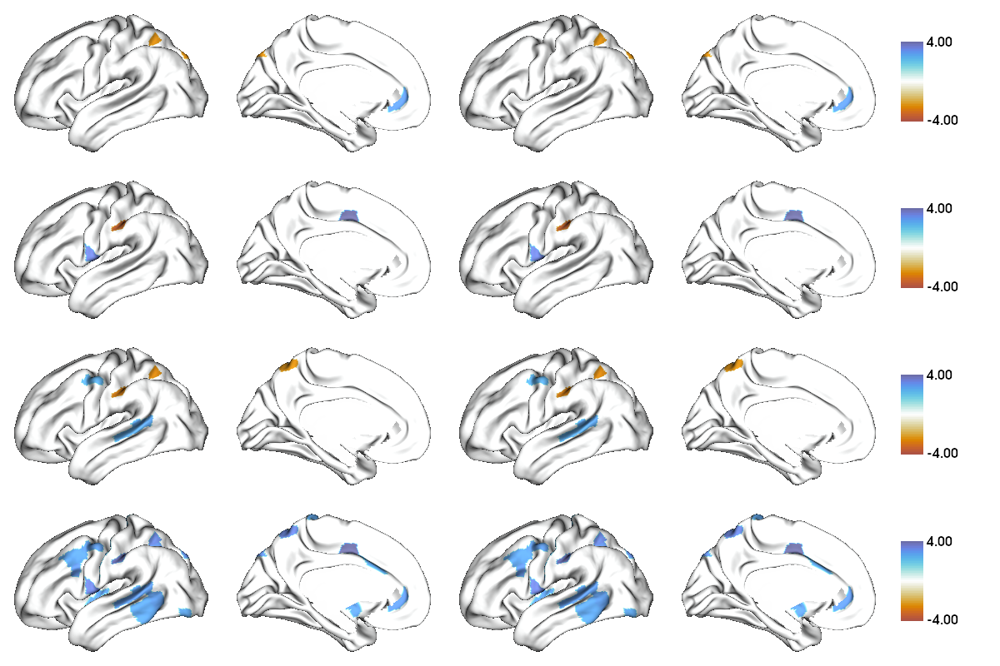

In [82]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/interact_t_intra_fiq_fd.png')

In [83]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
ste = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])

In [84]:
def t_pfdr(num_1, num_2, node, ga, filename): # ga: 'group' or 'age'
  contrast = phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))]
  model = FixedEffect(phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))], ga)
  slm_g1 = SLM(model, contrast=contrast)
  slm_g1.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[0].T)
  slm_g2 = SLM(model, contrast=contrast)
  slm_g2.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[1].T)
  slm_g3 = SLM(model, contrast=contrast)
  slm_g3.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[2].T)
  slm_g123 = SLM(model, contrast=contrast)
  slm_g123.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))])
  t_g1 = slm_g1.t[0]
  t_g2 = slm_g2.t[0]
  t_g3 = slm_g3.t[0]
  p_g1 = np.zeros(node)
  p_g2 = np.zeros(node)
  p_g3 = np.zeros(node)
  t_g123 = slm_g123.t[0]
  p_g123 = np.zeros(node)
  dof = model.shape[0] - model.shape[1] # degree of freedom
  for i in range(node):
    # p-value for one-sided test two-side = *2, multivariates just one side
    p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
    p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
    p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
    p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

  p_g1[p_g1>thres] = 1
  p_g2[p_g2>thres] = 1
  p_g3[p_g3>thres] = 1
  a = fdr(p_g123)
  a[a>0.05]=1
  np.savetxt('../results/'+filename+'_t_p_g1g2g3_pdfr123_fiq_fd.csv', 
             np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)
  return print('Finish saving ' + filename)

In [85]:
t_pfdr(0, 3, 180, 'group', 'intra_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'intra_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'intra_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'intra_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'intra_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'intra_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'intra_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'intra_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'intra_asd_adol_kid')

Finish saving intra_adult_con_asd
Finish saving intra_adol_con_asd
Finish saving intra_kid_con_asd
Finish saving intra_con_adult_adol
Finish saving intra_con_adult_kid
Finish saving intra_con_adol_kid
Finish saving intra_asd_adult_adol
Finish saving intra_asd_adult_kid
Finish saving intra_asd_adol_kid


### parcel-wise

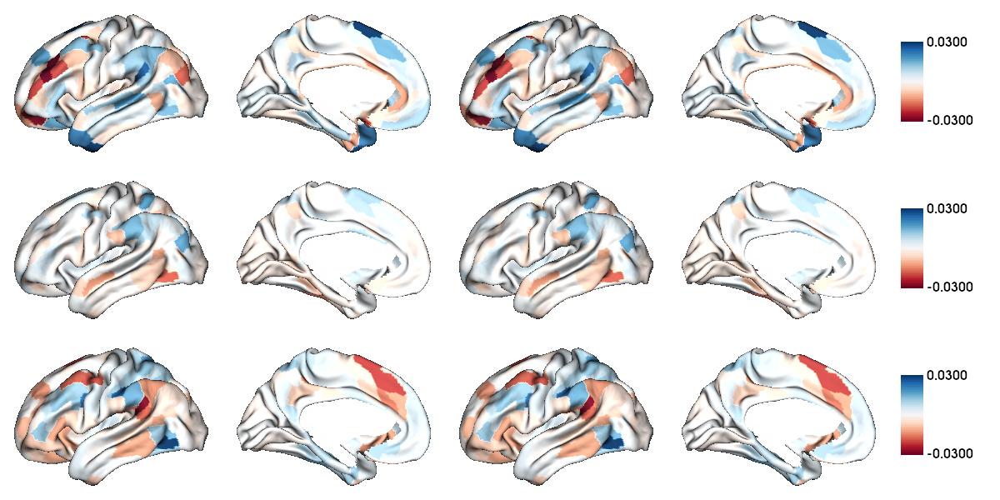

In [87]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_intra_fiq_fd')

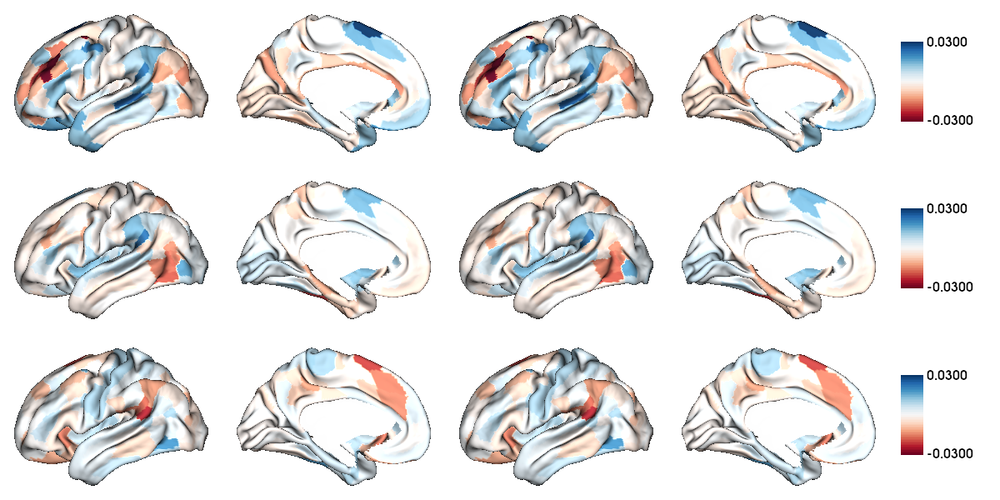

In [88]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_intra_fiq_fd')

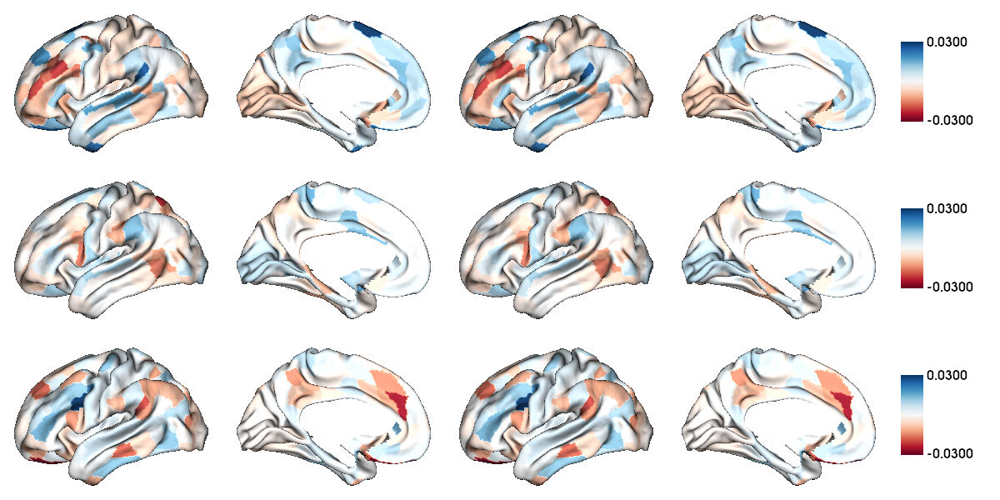

In [89]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_intra_fiq_fd')

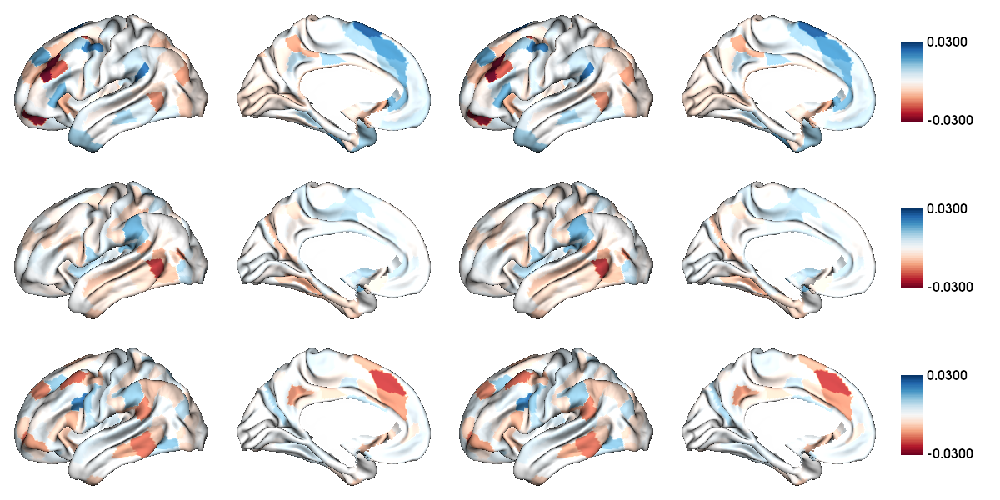

In [90]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_intra_fiq_fd')

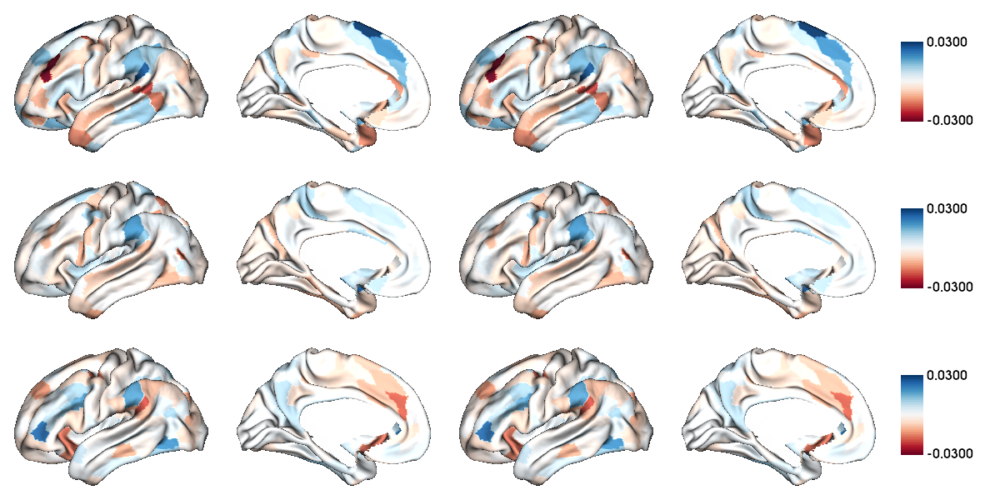

In [91]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_intra_fiq_fd')

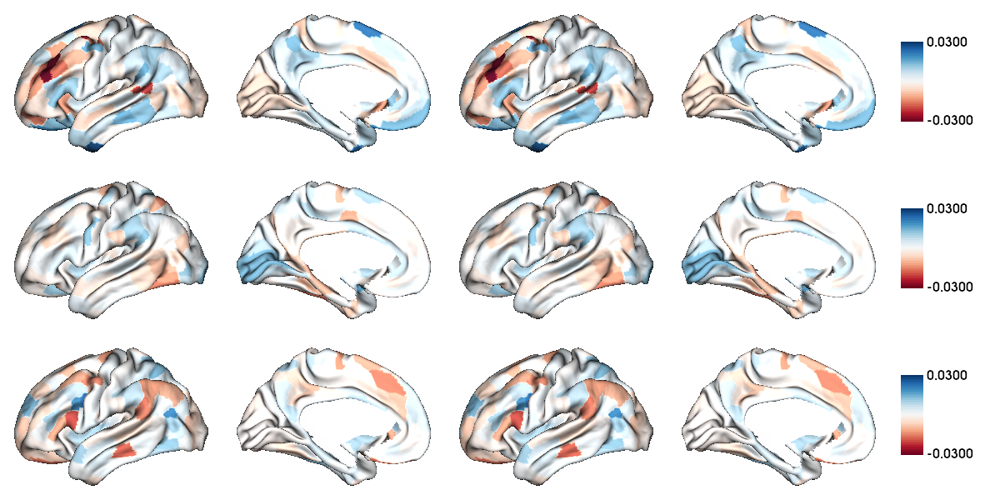

In [92]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_intra_fiq_fd')

### network-wise

In [150]:
path = '../results/grad/network/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [94]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [95]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [96]:
t_g1, t_g2, t_g3, t_g123

(array([-2.12244882, -1.03064491, -0.24230614,  1.27640862, -0.02637605,
        -0.02220157, -0.00511493,  1.59786835, -0.23420741, -1.81087941,
         1.4848079 ,  0.34915425]),
 array([ 0.30442258,  0.09250379,  0.72152974,  1.85689968, -2.35094399,
        -0.22293345, -1.87326916,  1.13612187, -0.41630504, -1.17704895,
         0.20402278,  0.70529442]),
 array([ 0.58604802, -2.07007256,  0.8416721 ,  0.01963841, -0.99520366,
         3.82842718,  0.83630849,  1.09032535, -0.74829912,  0.30733839,
        -1.8906054 ,  0.02854956]),
 array([2.40744788, 2.3569091 , 1.22240108, 1.99066132, 2.910508  ,
        3.90694468, 2.10911009, 1.81729436, 0.86531293, 2.36283957,
        2.20633061, 0.70645985]))

In [97]:
p_g1, p_g2, p_g3, p_g123

(array([0.0346809 , 0.30359998, 0.80872097, 0.20287256, 0.97897625,
        0.98230304, 0.99592255, 0.11120418, 0.81499573, 0.07123503,
        0.13872366, 0.72723688]),
 array([0.7610329 , 0.92636417, 0.47118787, 0.06437927, 0.0194219 ,
        0.82375043, 0.06207665, 0.25688051, 0.67750687, 0.24017914,
        0.83848444, 0.48121544]),
 array([5.58317040e-01, 3.93655980e-02, 4.00692362e-01, 9.84345861e-01,
        3.20499558e-01, 1.59265751e-04, 4.03697069e-01, 2.76510624e-01,
        4.54910074e-01, 7.58815096e-01, 5.97131652e-02, 9.77244253e-01]),
 array([8.35693316e-03, 9.55943652e-03, 1.11293826e-01, 2.37467786e-02,
        1.94967827e-03, 5.86749777e-05, 1.79130354e-02, 3.51223606e-02,
        1.93805241e-01, 9.41086420e-03, 1.40878271e-02, 2.40245879e-01]))

In [98]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.41617077, 0.60719996, 1.        , 0.48689414, 1.        ,
        1.        , 0.99592255, 0.4448167 , 1.        , 0.42741016,
        0.41617097, 1.        ]),
 array([1.        , 0.92636417, 0.94237574, 0.25751708, 0.23306285,
        0.98850051, 0.37245991, 0.61651321, 1.        , 0.72053743,
        0.9147103 , 0.82494076]),
 array([0.74442272, 0.23619359, 0.80138472, 0.98434586, 0.76919894,
        0.00191119, 0.69205212, 0.82953187, 0.68236511, 0.91057812,
        0.23885266, 1.        ]),
 array([0.03342773, 0.02294265, 0.13355259, 0.03562017, 0.01169807,
        0.0007041 , 0.03070806, 0.04682981, 0.2114239 , 0.02823259,
        0.02817565, 0.24024588]))

In [99]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/intra_mean_ca_'+name[j]+'_fiq_fd.csv', mean[j])
  np.savetxt('../results/intra_sd_ca_'+name[j]+'_fiq_fd.csv', sd[j])

In [100]:
t_pfdr(0, 3, 12, 'group', 'ca_intra_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_intra_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_intra_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_intra_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_intra_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_intra_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_intra_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_intra_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_intra_asd_adol_kid')

Finish saving ca_intra_adult_con_asd
Finish saving ca_intra_adol_con_asd
Finish saving ca_intra_kid_con_asd
Finish saving ca_intra_con_adult_adol
Finish saving ca_intra_con_adult_kid
Finish saving ca_intra_con_adol_kid
Finish saving ca_intra_asd_adult_adol
Finish saving ca_intra_asd_adult_kid
Finish saving ca_intra_asd_adol_kid


In [101]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([0]), array([4]), array([1, 5])]

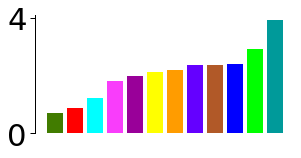

In [103]:
fu.plot_t_single(t_g123, '../figures/ca_interact_intra_multiT_fiq_fd.png')

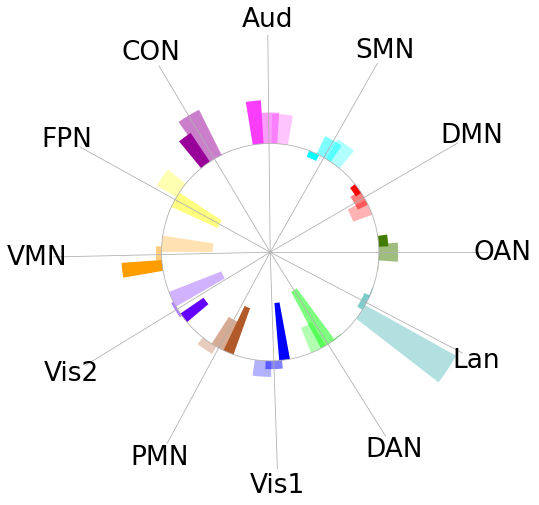

In [104]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_interact_intra_t_g123_fiq_fd.png')

## inter

### stats

In [106]:
path = '../results/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [107]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [108]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [109]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-3.0892021264700413,
 2.7946730301927656,
 -2.2361594018389344,
 3.488089861005378,
 -3.0950894418821373,
 3.0542502519595116,
 0.11229237456337537,
 3.800207721084789)

In [110]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.0022094696844313466,
 0.0005650569642527693,
 0.002167521234491382,
 8.876449983868664e-05)

In [111]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.3372175342035022,
 0.10171025356549847,
 0.2226869264702834,
 0.009631584060815147)

In [112]:
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/interact_t_p_g1g2g3_pdfr123_inter_fiq_fd.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [113]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

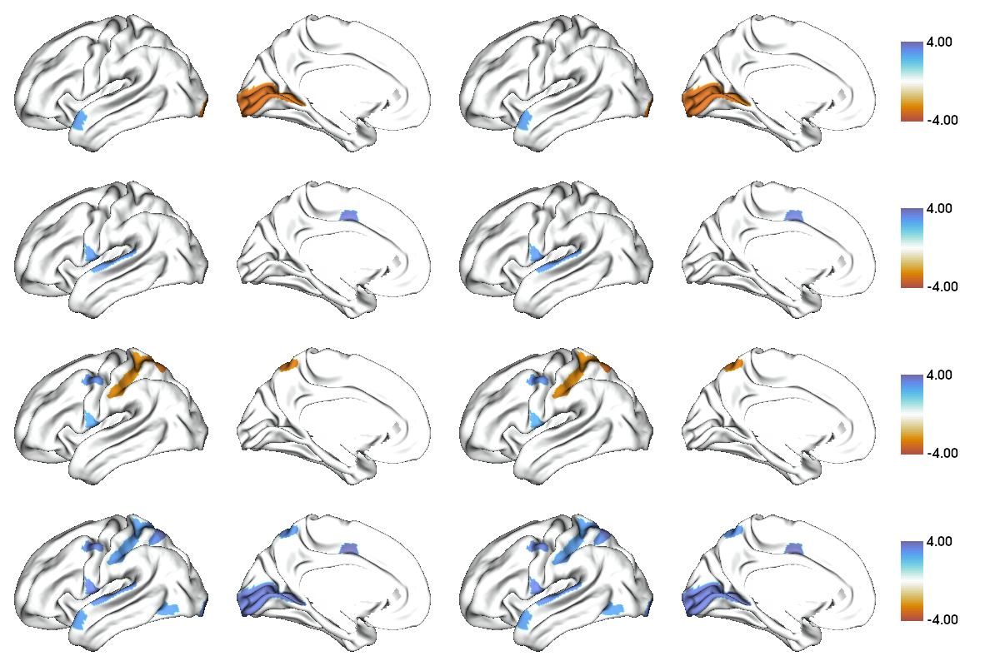

In [114]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/interact_t_inter_fiq_fd.png')

In [115]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()

In [116]:
t_pfdr(0, 3, 180,  'group', 'inter_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'inter_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'inter_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'inter_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'inter_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'inter_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'inter_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'inter_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'inter_asd_adol_kid')

Finish saving inter_adult_con_asd
Finish saving inter_adol_con_asd
Finish saving inter_kid_con_asd
Finish saving inter_con_adult_adol
Finish saving inter_con_adult_kid
Finish saving inter_con_adol_kid
Finish saving inter_asd_adult_adol
Finish saving inter_asd_adult_kid
Finish saving inter_asd_adol_kid


### parcel-wise

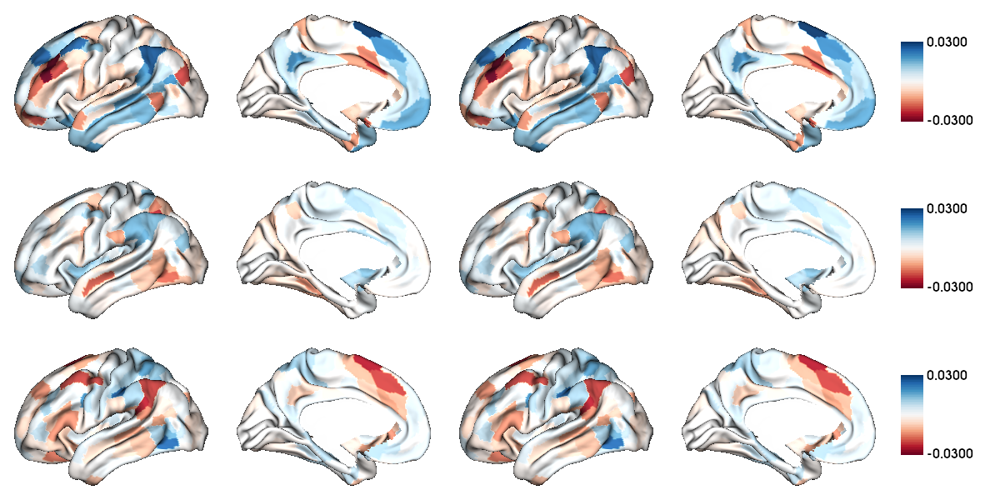

In [118]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_inter_fiq_fd')

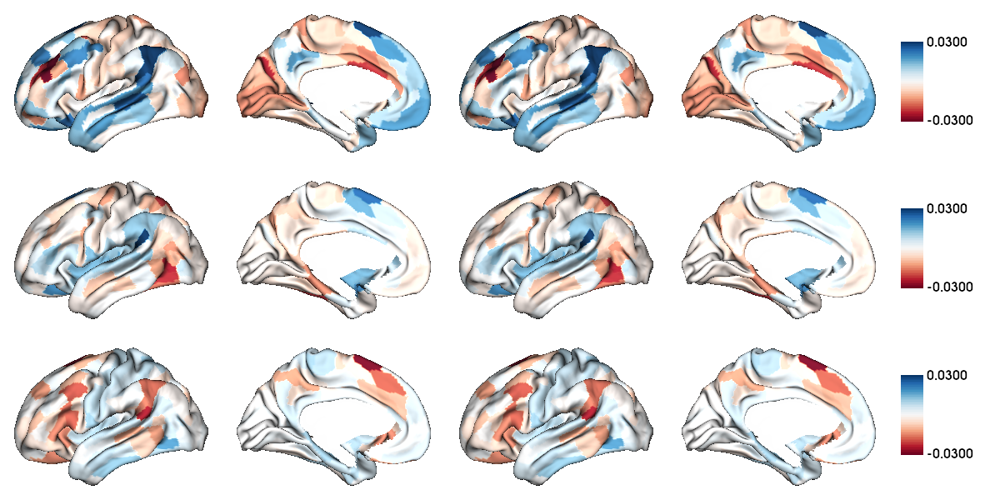

In [119]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_inter_fiq_fd')

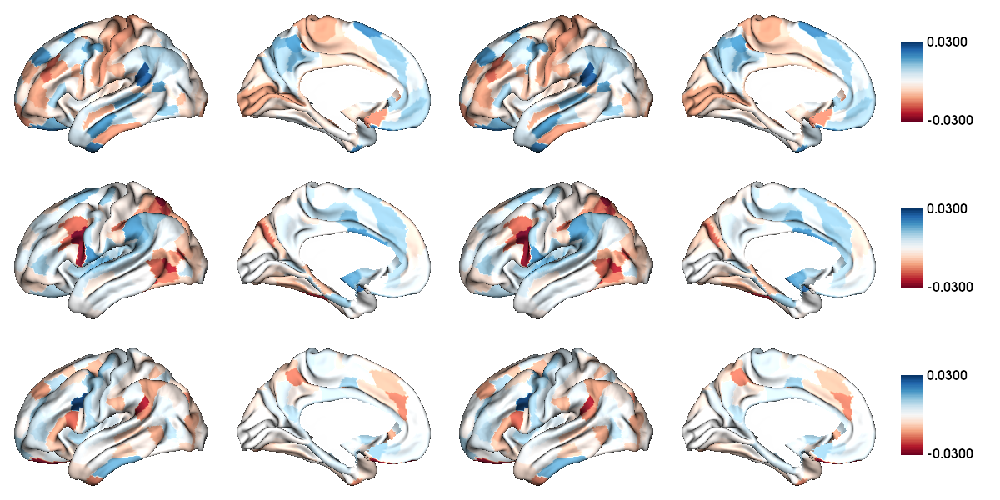

In [120]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_inter_fiq_fd')

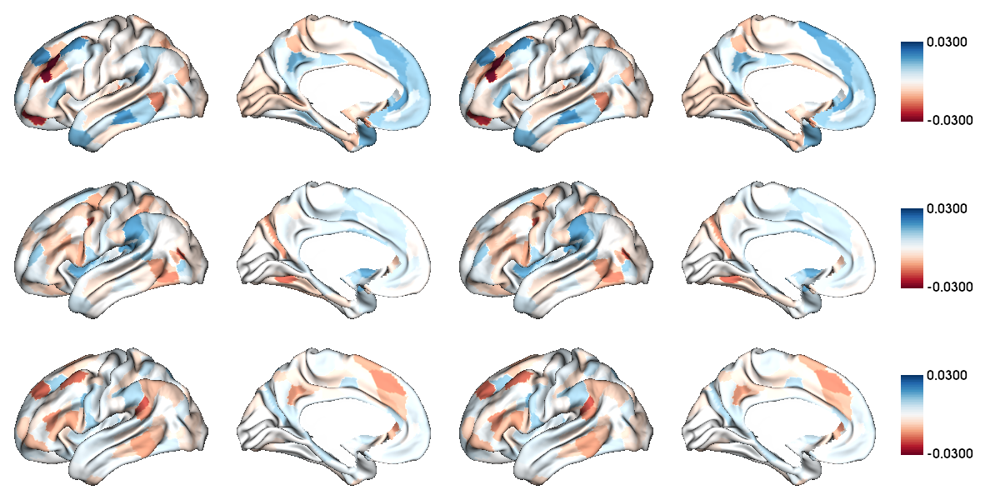

In [121]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_inter_fiq_fd')

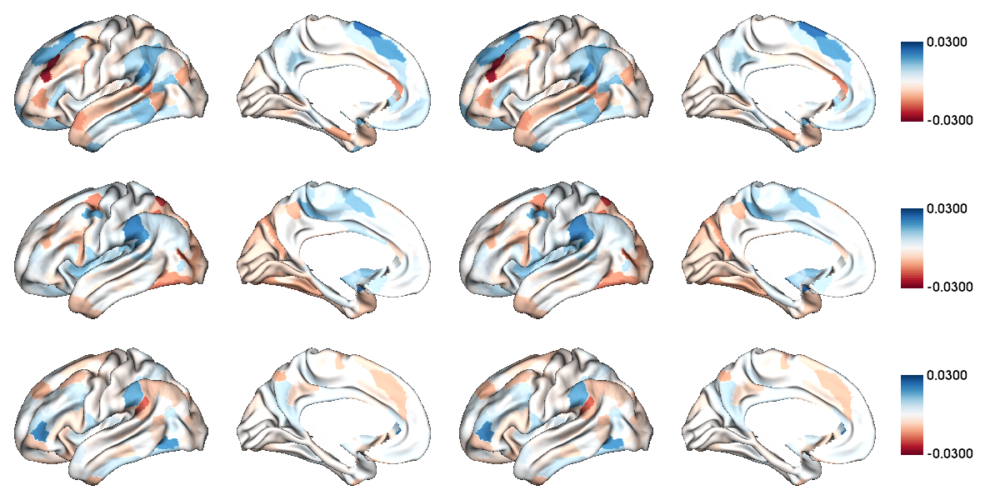

In [122]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_inter_fiq_fd')

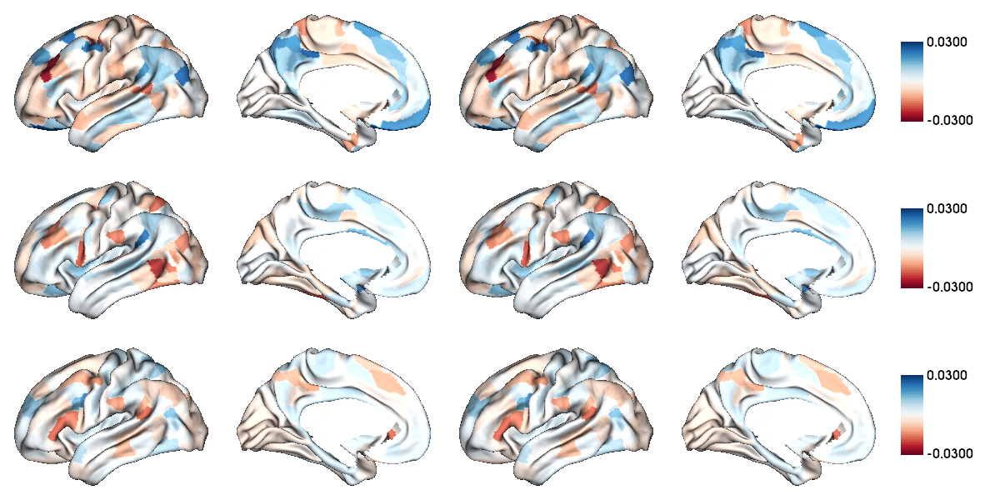

In [123]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_inter_fiq_fd')

### network-wise

In [124]:
path = '../results/grad/network/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [125]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [126]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [127]:
t_g1, t_g2, t_g3, t_g123

(array([-2.25461605, -0.26570498, -0.47999361,  1.61158222,  1.22658962,
         0.26966466,  0.06135696,  1.10291094, -0.78983689, -1.40074448,
         1.42900198, -0.22579493]),
 array([ 0.5910797 , -0.52464012, -0.01504622,  1.81123832, -1.40434228,
        -0.62649798, -1.43952859,  1.92736005,  0.14981322,  0.22886417,
         0.53995062,  0.57465454]),
 array([ 1.53615716, -1.95897715, -0.71429726,  1.33763693, -1.76027083,
         2.05368395,  0.1806693 ,  0.0698485 ,  1.38413536,  0.0307855 ,
        -1.00673474,  1.20734335]),
 array([2.88695893, 2.15749098, 0.88025294, 2.76252177, 2.42753681,
        2.25308007, 1.49858323, 2.0391223 , 1.676724  , 1.4744101 ,
        1.76535689, 1.37749382]))

In [128]:
p_g1, p_g2, p_g3, p_g123

(array([0.02493299, 0.79066266, 0.63160802, 0.10818352, 0.22101101,
        0.78761759, 0.95111886, 0.27101626, 0.43029379, 0.16240171,
        0.1541223 , 0.82152623]),
 array([0.55494557, 0.60024999, 0.98800606, 0.07117932, 0.16132919,
        0.53150062, 0.15112184, 0.05494994, 0.88102022, 0.81914215,
        0.58966179, 0.56598802]),
 array([0.12563309, 0.05111132, 0.47564056, 0.18210418, 0.07945761,
        0.04093821, 0.85675832, 0.94436428, 0.16742317, 0.97546261,
        0.31493458, 0.22832249]),
 array([0.00209706, 0.01591054, 0.18973994, 0.0030584 , 0.00791734,
        0.01251546, 0.06755618, 0.02119005, 0.04735825, 0.07074933,
        0.03929883, 0.08473181]))

In [129]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.29919589, 0.94879519, 0.94741204, 0.64910114, 0.53042643,
        1.        , 0.95111886, 0.54203252, 0.7376465 , 0.48720512,
        0.61648921, 0.89621043]),
 array([1.        , 0.80033332, 0.98800606, 0.4270759 , 0.48398756,
        1.        , 0.60448737, 0.65939926, 0.96111296, 0.98297058,
        0.88449269, 0.97026518]),
 array([0.37689926, 0.30666792, 0.63418741, 0.36420835, 0.31783043,
        0.49125847, 1.        , 1.        , 0.40181561, 0.97546261,
        0.47240186, 0.39140998]),
 array([0.02516473, 0.0381853 , 0.18973994, 0.0183504 , 0.03166935,
        0.03754637, 0.09007491, 0.0423801 , 0.07103738, 0.0848992 ,
        0.06736943, 0.0924347 ]))

In [130]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/inter_mean_ca_'+name[j]+'.csv', mean[j])
  np.savetxt('../results/inter_sd_ca_'+name[j]+'.csv', sd[j])

In [131]:
t_pfdr(0, 3, 12, 'group', 'ca_inter_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_inter_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_inter_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_inter_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_inter_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_inter_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_inter_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_inter_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_inter_asd_adol_kid')

Finish saving ca_inter_adult_con_asd
Finish saving ca_inter_adol_con_asd
Finish saving ca_inter_kid_con_asd
Finish saving ca_inter_con_adult_adol
Finish saving ca_inter_con_adult_kid
Finish saving ca_inter_con_adol_kid
Finish saving ca_inter_asd_adult_adol
Finish saving ca_inter_asd_adult_kid
Finish saving ca_inter_asd_adol_kid


In [132]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([0]), array([], dtype=int64), array([5])]

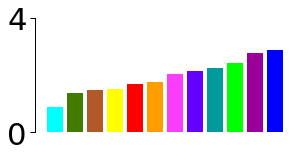

In [134]:
fu.plot_t_single(t_g123, '../figures/ca_interact_inter_multiT_fiq_fd.png')

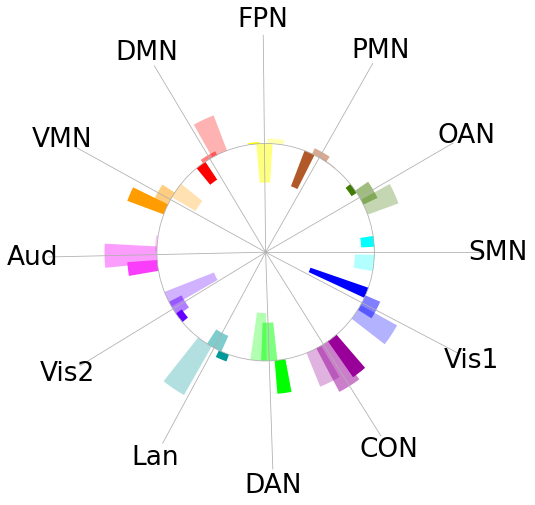

In [135]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_interact_inter_t_g123_fiq_fd.png')